In [319]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
from pandas_datareader import data as web
import datetime as dt
from statsmodels.tools import add_constant
from statsmodels.regression.linear_model import OLS
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests
from scipy.stats import linregress
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

API_KEY = 'b238c80ba46a0179b0a0d0a90cf0c7fa'  # Replace with your FRED API key


## Data Prep

In [256]:
def clean_series(s):
    """Return 1-D Series, TZ-naive, month-end ('ME')."""
    if isinstance(s, pd.DataFrame) and s.shape[1] == 1:
        s = s.iloc[:, 0]
    s = s.dropna().copy()
    s.index = pd.to_datetime(s.index).tz_localize(None)
    return s.resample('ME').last()

def pmt(rate, nper, pv):
    """Level payment on amortizing loan."""
    return rate * pv / (1 - (1 + rate) ** -nper)

# ----------------------------------------------------------------------
# 1. Macro-factor fetcher  (start date adjustable)
# ----------------------------------------------------------------------
def fetch_macro_data(start='2005-01-01'):
    # Fed funds (anchor)
    R   = clean_series(web.DataReader('FEDFUNDS', 'fred', start)['FEDFUNDS']) / 100
    idx = R.index

    # Core CPI YoY
    CPI_lvl = clean_series(web.DataReader('CPILFESL', 'fred', start)['CPILFESL']).reindex(idx)
    CPI     = CPI_lvl.pct_change(12, fill_method=None); CPI.name = 'CPI'

    # Default premium (Baa – Aaa)
    BAA = clean_series(web.DataReader('BAA10Y', 'fred', start)['BAA10Y']).reindex(idx)
    AAA = clean_series(web.DataReader('AAA10Y', 'fred', start)['AAA10Y']).reindex(idx)
    DEF = (BAA - AAA); DEF.name = 'DEF'

    # 10y – 3m term premium
    DGS10 = clean_series(web.DataReader('DGS10', 'fred', start)['DGS10']).reindex(idx)
    TB3MS = clean_series(web.DataReader('TB3MS', 'fred', start)['TB3MS']).reindex(idx)
    TERM  = (DGS10 - TB3MS) / 100; TERM.name = 'TERM'

    # Dividend yield (S&P 500 price vs SPY dividends)
    sp   = clean_series(yf.download('^GSPC', start=start,end  = pd.Timestamp.today())['Close'].resample('M').last()).reindex(idx)
    divs = clean_series(yf.Ticker('SPY').dividends.resample('ME').sum()).reindex(idx)
    if divs.isna().all():                                              # safety fallback
        divs = pd.Series(0.015, index=idx)
    DivY = (divs / sp); DivY.name = 'DivY'

    # Housing affordability components
    # ── 2.1  True housing-payment affordability ───────────────────────────────
    HPI   = clean_series(web.DataReader('MSPUS','fred',start)['MSPUS']).reindex(idx).ffill()
    INC   = clean_series(web.DataReader('MEHOINUSA646N','fred',start)['MEHOINUSA646N']).reindex(idx).ffill()
    # ── 2.2  Mortgage rate (30-yr fixed)
    # Note: FRED's MORTGAGE30US is not seasonally adjusted,
    #       so we use the last observation of each month.
    #       This is a common practice in macroeconomics.
    #       The data is in percent, so we divide by 100.
    MORTG = clean_series(web.DataReader('MORTGAGE30US','fred',start)['MORTGAGE30US']).reindex(idx).ffill() / 100

    loan_amt        = HPI * 0.80                       # 80 % LTV
    monthly_payment = pmt(MORTG / 12, 360, loan_amt)   # 30-yr amort
    monthly_income  = INC / 12
    AFFORD = (monthly_payment / monthly_income).rename('AFFORD')
    MORTG.name = 'MORTG'

    # Assemble factors & one-period shift to avoid look-ahead
    df = pd.DataFrame({'R':R, 'CPI':CPI, 'DEF':DEF, 'TERM':TERM,
                       'DivY':DivY, 'AFFORD':AFFORD, 'MORTG':MORTG}, index=idx)
    factors = df.shift(1).dropna(subset=['R','CPI','DEF','TERM'])      # keep rows w/ core data

    # VNQ prices for back-test
    vnq_prices = clean_series(yf.download('VNQ', start=start, end=pd.Timestamp.today(), auto_adjust=True)['Close'])

    return factors, vnq_prices

factors, vnq_prices = fetch_macro_data('2005-01-01')
print("Factor window:", factors.first_valid_index(), "to", factors.last_valid_index())
print(factors.head())

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Factor window: 2006-02-28 00:00:00 to 2025-06-30 00:00:00
                 R       CPI   DEF    TERM      DivY    AFFORD   MORTG
DATE                                                                  
2006-02-28  0.0429  0.021106  0.92  0.0029  0.000000  0.299602  0.0612
2006-03-31  0.0449  0.021063  0.89  0.0012  0.000000  0.304082  0.0626
2006-04-30  0.0459  0.020990  0.88  0.0035  0.000401  0.306976  0.0635
2006-05-31  0.0479  0.022977  0.79  0.0047  0.000000  0.312650  0.0658
2006-06-30  0.0494  0.024439  0.83  0.0040  0.000000  0.313946  0.0662


In [257]:
holdings = ('AMT', 'PLD', 'WELL', 'EQIX', 'DLR', 'SPG', 'PSA')
debt_to_equity = {}
for stock in holdings:
    yf_ticker = yf.Ticker(stock)
    info= yf_ticker.get_info()
    debt_to_equity[stock] = info.get('debtToEquity', None)
print(debt_to_equity)

{'AMT': 446.681, 'PLD': 56.643, 'WELL': 49.196, 'EQIX': 141.235, 'DLR': 79.552, 'SPG': 773.472, 'PSA': 97.458}


In [258]:
debt_to_equity_series = pd.Series(debt_to_equity)
debt_to_equity_sorted = debt_to_equity_series.sort_values(ascending=False)
high_indebted = debt_to_equity_sorted[:len(debt_to_equity_sorted)//2]
low_indebted = debt_to_equity_sorted[len(debt_to_equity_sorted)//2:]
print("Top 50%:", high_indebted)
print("Bottom 50%:", low_indebted)

Top 50%: SPG     773.472
AMT     446.681
EQIX    141.235
dtype: float64
Bottom 50%: PSA     97.458
DLR     79.552
PLD     56.643
WELL    49.196
dtype: float64


In [259]:
# Download adjusted close prices
start_date = '2006-01-01'
high_prices = yf.download(list(high_indebted.keys()), start=start_date, end=dt.datetime.today())['Close'].resample('ME').last()
low_prices  = yf.download(list(low_indebted.keys()), start=start_date, end=dt.datetime.today())['Close'].resample('ME').last()
print(high_prices.first_valid_index(), "through", high_prices.last_valid_index())
print(low_prices.first_valid_index(), "through", low_prices.last_valid_index()) 
# Calculate monthly returns
high_returns = high_prices.pct_change().dropna()
low_returns  = low_prices.pct_change().dropna()

# Equally weighted portfolio returns
high_portfolio = high_returns.mean(axis=1)
low_portfolio  = low_returns.mean(axis=1)

# Real Estate Premium (REP)
REP = (high_portfolio - low_portfolio).rename('REP')

[*********************100%***********************]  3 of 3 completed
[*********************100%***********************]  4 of 4 completed

2006-01-31 00:00:00 through 2025-07-31 00:00:00
2006-01-31 00:00:00 through 2025-07-31 00:00:00


In [260]:
print(REP.first_valid_index(), "through", REP.last_valid_index())
print(REP.head())

2006-02-28 00:00:00 through 2025-07-31 00:00:00
Date
2006-02-28    0.015043
2006-03-31    0.030025
2006-04-30    0.089987
2006-05-31   -0.023446
2006-06-30   -0.030962
Freq: ME, Name: REP, dtype: float64


In [261]:
factors['REP'] = REP
factors.head()

,R,CPI,DEF,TERM,DivY,AFFORD,MORTG,REP
DATE,,,,,,,,
2006-02-28,0.0429,0.021106,0.92,0.0029,0.000000,0.299602,0.0612,0.015043
2006-03-31,0.0449,0.021063,0.89,0.0012,0.000000,0.304082,0.0626,0.030025
2006-04-30,0.0459,0.020990,0.88,0.0035,0.000401,0.306976,0.0635,0.089987
2006-05-31,0.0479,0.022977,0.79,0.0047,0.000000,0.312650,0.0658,-0.023446
2006-06-30,0.0494,0.024439,0.83,0.0040,0.000000,0.313946,0.0662,-0.030962


hat “Empty DataFrame” with 399 weird columns (dates as columns) and 0 rows happens because of one of two common issues:

In [262]:
# Cell — ADF stationarity tests
# 1) Prepare your series dictionary
series_dict = {
    'VNQ_ret': vnq_prices.pct_change().dropna(),
    'R':       factors['R'],
    'CPI':     factors['CPI'],
    'DEF':     factors['DEF'],
    'TERM':    factors['TERM'],
    'DivY':    factors['DivY'],
    'AFFORD':  factors['AFFORD'],
    'MORTG':   factors['MORTG']
}

# 2) Run ADF on each
results = []
for name, series in series_dict.items():
    # drop NaNs and run ADF with default lag selection (AIC)
    clean = series.dropna()
    adf_stat, pvalue, used_lag, nobs, crit_vals, icbest = adfuller(clean, autolag='AIC')
    results.append({
        'Series':      name,
        'ADF Stat':    adf_stat,
        'p-value':     pvalue,
        'Lags Used':   used_lag,
        'nobs':        nobs,
        '1% Crit':     crit_vals['1%'],
        '5% Crit':     crit_vals['5%'],
        '10% Crit':    crit_vals['10%']
    })

# 3) Tabulate results
adf_df = pd.DataFrame(results).set_index('Series')
print(adf_df[['ADF Stat','p-value','Lags Used','nobs','1% Crit','5% Crit','10% Crit']])


         ADF Stat       p-value  Lags Used  nobs   1% Crit   5% Crit  10% Crit
Series                                                                        
VNQ_ret -6.870554  1.519541e-09          5   240 -3.457894 -2.873659 -2.573229
R       -2.560127  1.015213e-01          5   227 -3.459490 -2.874358 -2.573602
CPI     -2.023067  2.765515e-01         13   219 -3.460567 -2.874830 -2.573853
DEF     -3.388359  1.136216e-02          1   231 -3.458980 -2.874135 -2.573482
TERM    -1.611497  4.771900e-01          0   232 -3.458855 -2.874080 -2.573453
DivY    -1.806071  3.774520e-01         14   218 -3.460708 -2.874891 -2.573886
AFFORD  -1.919563  3.229146e-01         12   220 -3.460428 -2.874769 -2.573821
MORTG   -1.791014  3.849319e-01         12   220 -3.460428 -2.874769 -2.573821


In [263]:
# Difference non-stationary factors
diff_factors = factors.diff().dropna()

# Replace original non-stationary columns
for col in ['R','CPI','TERM','DivY','AFFORD','MORTG']:
    if col in diff_factors:
        factors[col] = diff_factors[col]


## Cell — ADF stationarity tests

In [ ]:

# 1) Prepare your series dictionary
series_dict = {
    'VNQ_ret': vnq_prices.pct_change().dropna(),
    'R':       factors['R'],
    'CPI':     factors['CPI'],
    'DEF':     factors['DEF'],
    'TERM':    factors['TERM'],
    'DivY':    factors['DivY'],
    'AFFORD':  factors['AFFORD'],
    'MORTG':   factors['MORTG']
}

# 2) Run ADF on each
results = []
for name, series in series_dict.items():
    # drop NaNs and run ADF with default lag selection (AIC)
    clean = series.dropna()
    adf_stat, pvalue, used_lag, nobs, crit_vals, icbest = adfuller(clean, autolag='AIC')
    results.append({
        'Series':      name,
        'ADF Stat':    adf_stat,
        'p-value':     pvalue,
        'Lags Used':   used_lag,
        'nobs':        nobs,
        '1% Crit':     crit_vals['1%'],
        '5% Crit':     crit_vals['5%'],
        '10% Crit':    crit_vals['10%']
    })

# 3) Tabulate results
adf_df = pd.DataFrame(results).set_index('Series')
print(adf_df[['ADF Stat','p-value','Lags Used','nobs','1% Crit','5% Crit','10% Crit']])


          ADF Stat       p-value  Lags Used  nobs   1% Crit   5% Crit  \
Series                                                                  
VNQ_ret  -6.870554  1.519541e-09          5   240 -3.457894 -2.873659   
R        -3.610972  5.554706e-03          4   227 -3.459490 -2.874358   
CPI      -4.327925  3.972677e-04         14   217 -3.460849 -2.874953   
DEF      -3.388359  1.136216e-02          1   231 -3.458980 -2.874135   
TERM    -11.368412  9.105366e-21          1   230 -3.459106 -2.874190   
DivY     -4.703070  8.304248e-05         13   218 -3.460708 -2.874891   
AFFORD   -3.719269  3.850145e-03         12   219 -3.460567 -2.874830   
MORTG   -13.864604  6.633063e-26          0   231 -3.458980 -2.874135   

         10% Crit  
Series             
VNQ_ret -2.573229  
R       -2.573602  
CPI     -2.573919  
DEF     -2.573482  
TERM    -2.573512  
DivY    -2.573886  
AFFORD  -2.573853  
MORTG   -2.573482  


In [267]:
# returns aligned to factor index
ret = vnq_prices.pct_change().dropna().reindex(factors.index)

print("Factor rows :", len(factors))
print("Return rows :", len(ret))
print(factors.head(3))
print(ret.head(3))


Factor rows : 233
Return rows : 233
                R       CPI   DEF    TERM      DivY    AFFORD   MORTG  \
DATE                                                                    
2006-02-28    NaN       NaN  0.92     NaN       NaN       NaN     NaN   
2006-03-31  0.002 -0.000042  0.89 -0.0017  0.000000  0.004480  0.0014   
2006-04-30  0.001 -0.000074  0.88  0.0023  0.000401  0.002895  0.0009   

                 REP  DEF_lag3  DEF_lag4  ...  DEF_lag9  MORTG_lag9  \
DATE                                      ...                         
2006-02-28  0.015043       NaN       NaN  ...       NaN         NaN   
2006-03-31  0.030025       NaN       NaN  ...       NaN         NaN   
2006-04-30  0.089987       NaN       NaN  ...       NaN         NaN   

            MORTG_lag10  MORTG_lag11  MORTG_lag12  REP_lag9  REP_lag10  \
DATE                                                                     
2006-02-28          NaN          NaN          NaN       NaN        NaN   
2006-03-31          

## Granger

In [318]:
def pairwise_granger_all(df, target='VNQ_ret', maxlag=12, alpha=0.05):
    """
    Run pairwise Granger causality tests: all predictors → target
    - df: DataFrame with target + predictors
    - target: dependent variable (string)
    - maxlag: max lags to test
    - alpha: significance level for filtering
    """
    predictors = [col for col in df.columns if col != target]
    results = []

    for predictor in predictors:
        print(f"⏳ Testing if {predictor} → {target}")
        try:
            test_data = df[[target, predictor]].dropna()
            granger = grangercausalitytests(test_data, maxlag=maxlag, verbose=False)

            for lag, res in granger.items():
                f_pval = res[0]['ssr_ftest'][1]  # F-test p-value
                results.append({
                    'Predictor': predictor,
                    'Lag': lag,
                    'p-value': f_pval,
                    'Significant': f_pval < alpha
                })
        except Exception as e:
            print(f"⚠️ Skipping {predictor}: {e}")

    # Make summary DataFrame
    summary_df = pd.DataFrame(results)
    sig_df = summary_df[summary_df['Significant']].sort_values('p-value')
    return summary_df, sig_df

# Combine VNQ returns + macro factors
returns = vnq_prices.pct_change().dropna().rename('VNQ_ret')
data = pd.concat([returns, factors], axis=1).dropna()

# Run the pairwise Granger tests
all_results, sig_results = pairwise_granger_all(data, target='VNQ_ret', maxlag=12, alpha=0.05)

# Display results
print("\n📊 All Granger Test Results:")
print(all_results)

print("\n✅ Significant Granger Results (p < 0.05):")
print(sig_results)


⏳ Testing if R → VNQ_ret
⏳ Testing if CPI → VNQ_ret
⏳ Testing if DEF → VNQ_ret
⏳ Testing if TERM → VNQ_ret
⏳ Testing if DivY → VNQ_ret
⏳ Testing if AFFORD → VNQ_ret
⏳ Testing if MORTG → VNQ_ret
⏳ Testing if REP → VNQ_ret
⏳ Testing if DEF_lag3 → VNQ_ret
⏳ Testing if DEF_lag4 → VNQ_ret
⏳ Testing if DEF_lag5 → VNQ_ret
⏳ Testing if DEF_lag6 → VNQ_ret
⏳ Testing if DEF_lag7 → VNQ_ret
⏳ Testing if DEF_lag8 → VNQ_ret
⏳ Testing if DEF_lag9 → VNQ_ret
⏳ Testing if MORTG_lag9 → VNQ_ret
⏳ Testing if MORTG_lag10 → VNQ_ret
⏳ Testing if MORTG_lag11 → VNQ_ret
⏳ Testing if MORTG_lag12 → VNQ_ret
⏳ Testing if REP_lag9 → VNQ_ret
⏳ Testing if REP_lag10 → VNQ_ret
⏳ Testing if REP_lag11 → VNQ_ret
⏳ Testing if REP_lag12 → VNQ_ret
⏳ Testing if DivY_lag6 → VNQ_ret

📊 All Granger Test Results:
     Predictor  Lag   p-value  Significant
0            R    1  0.841644        False
1            R    2  0.254617        False
2            R    3  0.582528        False
3            R    4  0.878934        False
4       

## OLS

In [307]:

# ====================================================================
# 1.  Build lagged-factor matrix (based on significant Granger lags)
# ====================================================================
def make_lagged_X(factors, prices,
                  ar_lags = [1,2,3],
                  DEF_lags=[3,4,5],
                  MORTG_lags=[9,10,11],
                  REP_lags=[9,10,11]):
    """Return X (regressors) and y (VNQ returns) with no NaNs."""
    ret = prices.pct_change().rename('VNQ_ret')

    X = pd.DataFrame(index=factors.index)

    # AR lags (dependent variable’s own past)
    for j in ar_lags:
        X[f'VNQ_ret_l{j}'] = ret.shift(j)

    # DEF (already stationary after differencing in factors.diff())
    for k in DEF_lags:
        X[f'DEF_l{k}'] = factors['DEF'].shift(k)

    # MORTG (use first difference to ensure stationarity)
    dMORTG = factors['MORTG'].diff()
    for k in MORTG_lags:
        X[f'dMORTG_l{k}'] = dMORTG.shift(k)

    # REP (stationary)
    for k in REP_lags:
        X[f'REP_l{k}'] = factors['REP'].shift(k)

    X = add_constant(X).dropna()
    y = ret.reindex(X.index)
    return X, y

# --------------------------------------------------------------------
# Construct X and y
# --------------------------------------------------------------------
X, y = make_lagged_X(factors, vnq_prices)

print("Regressor set:", X.columns.tolist())
print("Sample length:", len(y), "rows   (", y.index[0].date(), "→", y.index[-1].date(), ")")

# ====================================================================
# 2.  Expanding-window OLS forecast & grid-search over thresholds
# ====================================================================
def expanding_ols_forecast(X, y, window=120):
    """Return Series of one-step-ahead forecasts."""
    pred = pd.Series(index=y.index, dtype=float)
    for i in range(window, len(y)):
        mod = OLS(y.iloc[:i], X.iloc[:i]).fit()
        pred.iloc[i] = mod.predict(X.iloc[i])
    return pred

pred = expanding_ols_forecast(X, y, window=120)



Regressor set: ['const', 'VNQ_ret_l1', 'VNQ_ret_l2', 'VNQ_ret_l3', 'DEF_l3', 'DEF_l4', 'DEF_l5', 'dMORTG_l9', 'dMORTG_l10', 'dMORTG_l11', 'REP_l9', 'REP_l10', 'REP_l11']
Sample length: 220 rows   ( 2007-03-31 → 2025-06-30 )


In [292]:
print(X)

            const  VNQ_ret_l1  VNQ_ret_l2  VNQ_ret_l3  DEF_l3  DEF_l4  DEF_l5  \
DATE                                                                            
2007-03-31    1.0   -0.026982    0.087792   -0.018426    0.90    0.86    0.94   
2007-04-30    1.0   -0.020749   -0.026982    0.087792    0.89    0.90    0.86   
2007-05-31    1.0   -0.001260   -0.020749   -0.026982    0.92    0.89    0.90   
2007-06-30    1.0   -0.003786   -0.001260   -0.020749    0.91    0.92    0.89   
2007-07-31    1.0   -0.090077   -0.003786   -0.001260    0.97    0.91    0.92   
...           ...         ...         ...         ...     ...     ...     ...   
2025-02-28    1.0    0.016502   -0.083722    0.042592    0.65    0.72    0.73   
2025-03-31    1.0    0.036996    0.016502   -0.083722    0.61    0.65    0.72   
2025-04-30    1.0   -0.025878    0.036996    0.016502    0.60    0.61    0.65   
2025-05-31    1.0   -0.024409   -0.025878    0.036996    0.60    0.60    0.61   
2025-06-30    1.0    0.01120

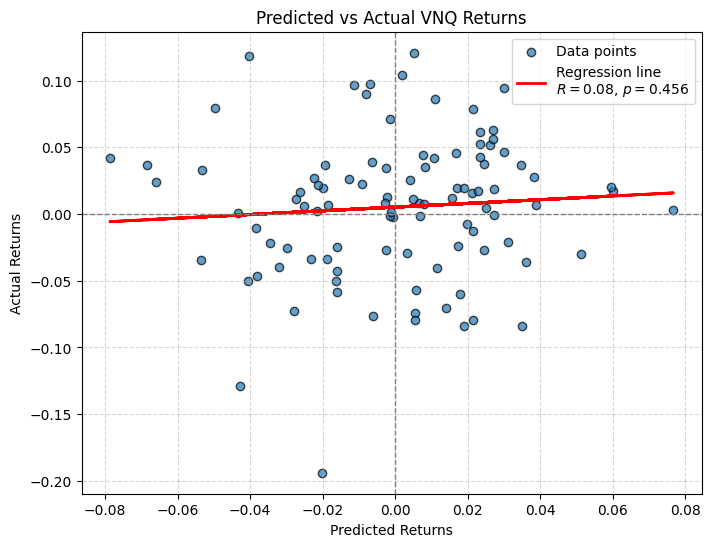

In [ ]:
# Drop NaNs
mask = (~pred.isna()) & (~y.isna())
x = pred[mask]
y = y[mask]

# Linear regression
slope, intercept, r_value, p_value, std_err = linregress(x, y)
line = slope * x + intercept

# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(x, y, alpha=0.7, edgecolor='k', label='Data points')
plt.plot(x, line, color='red', linewidth=2, label=f'Regression line\n$R={r_value:.2f}$, $p={p_value:.3f}$')
plt.title('Predicted vs Actual VNQ Returns')
plt.xlabel('Predicted Returns')
plt.ylabel('Actual Returns')
plt.axhline(0, color='grey', linestyle='--', linewidth=1)
plt.axvline(0, color='grey', linestyle='--', linewidth=1)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


## Lasso

α chosen on first window: 10.0000

📊 Evaluation:
Correlation (R): -0.051
RMSE: 0.05395


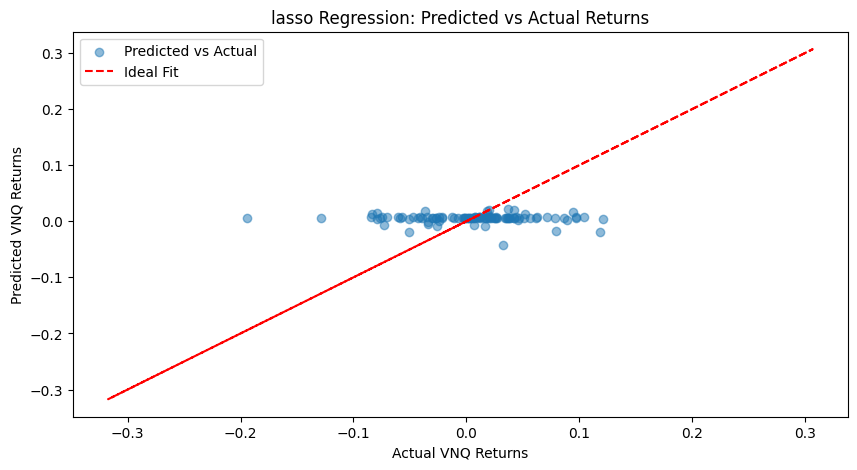


Signal distribution:
 0    204
 1     11
-1      5
Name: count, dtype: int64


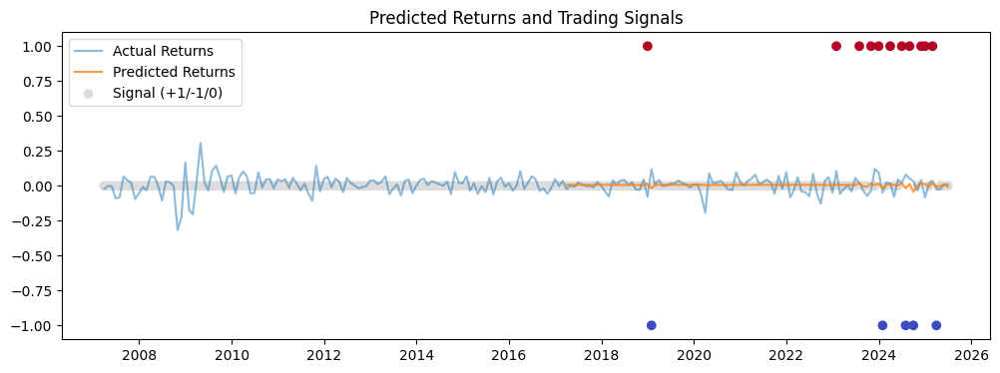

In [316]:
def make_lagged_X(factors, prices,
                  ar_lags = [1,2,3],
                  DEF_lags=[3,4,5],
                  MORTG_lags=[9,10,11],
                  REP_lags=[9,10,11]):
    """Return X (regressors) and y (VNQ returns) with no NaNs."""
    ret = prices.pct_change().rename('VNQ_ret')

    X = pd.DataFrame(index=factors.index)

    # AR lags (dependent variable’s own past)
    for j in ar_lags:
        X[f'VNQ_ret_l{j}'] = ret.shift(j)

    # DEF (already stationary after differencing in factors.diff())
    for k in DEF_lags:
        X[f'DEF_l{k}'] = factors['DEF'].shift(k)

    # MORTG (use first difference to ensure stationarity)
    dMORTG = factors['MORTG'].diff()
    for k in MORTG_lags:
        X[f'dMORTG_l{k}'] = dMORTG.shift(k)

    # REP (stationary)
    for k in REP_lags:
        X[f'REP_l{k}'] = factors['REP'].shift(k)

    X = X.dropna()
    y = ret.reindex(X.index)
    return X, y

# --------------------------------------------------------------------
# Construct X and y
# --------------------------------------------------------------------
X, y = make_lagged_X(factors, vnq_prices)

# ====================================================
# 2. Expanding-window lasso forecast
# ====================================================

def expanding_lasso_forecast_scaled(X, y, window=120,
                                    alphas=np.logspace(-3, 2, 30)):
    pred = pd.Series(index=y.index, dtype=float)
    for i in range(window, len(y)):
        X_train, y_train = X.iloc[:i], y.iloc[:i]

        scaler = StandardScaler().fit(X_train)
        X_train_z = scaler.transform(X_train)

        lasso = LassoCV(alphas=np.logspace(-4,1,30), cv=5)
        lasso.fit(X_train_z, y_train)

        if i == window:
            print(f"α chosen on first window: {lasso.alpha_:.4f}")

        pred.iloc[i] = lasso.predict(scaler.transform(X.iloc[[i]]))[0]
    return pred


# Run lasso
lasso_pred = expanding_lasso_forecast_scaled(X, y)

# ====================================================
# 3. Evaluate predictions
# ====================================================
def evaluate_preds(pred, y_true):
    mask = ~pred.isna()
    r = np.corrcoef(pred[mask], y_true[mask])[0,1]
    mse = mean_squared_error(y_true[mask], pred[mask])
    print(f"\n📊 Evaluation:")
    print(f"Correlation (R): {r:.3f}")
    print(f"RMSE: {np.sqrt(mse):.5f}")

evaluate_preds(lasso_pred, y)

# ====================================================
# 4. Plot predicted vs actual
# ====================================================
plt.figure(figsize=(10, 5))
plt.scatter(y, lasso_pred, alpha=0.5, label='Predicted vs Actual')
plt.plot(y, y, color='red', linestyle='--', label='Ideal Fit')
plt.xlabel('Actual VNQ Returns')
plt.ylabel('Predicted VNQ Returns')
plt.title('lasso Regression: Predicted vs Actual Returns')
plt.legend()
plt.show()

# ====================================================
# 5. Trading Signal (simple ±σ threshold)
# ====================================================
resid_std = lasso_pred.std()
signal = lasso_pred.apply(lambda x: 1 if x > resid_std else (-1 if x < -resid_std else 0))

print("\nSignal distribution:")
print(signal.value_counts())

# Plot signals over time
plt.figure(figsize=(12, 4))
plt.plot(lasso_pred.index, y, label='Actual Returns', alpha=0.5)
plt.plot(lasso_pred.index, lasso_pred, label='Predicted Returns', alpha=0.8)
plt.scatter(lasso_pred.index, signal, label='Signal (+1/-1/0)', c=signal, cmap='coolwarm', marker='o')
plt.legend()
plt.title('Predicted Returns and Trading Signals')
plt.show()


## SARIMAX TEST

                               SARIMAX Results                                
Dep. Variable:                VNQ_ret   No. Observations:                  120
Model:               SARIMAX(1, 0, 1)   Log Likelihood                 165.273
Date:                Wed, 09 Jul 2025   AIC                           -300.546
Time:                        22:29:29   BIC                           -258.986
Sample:                    03-31-2007   HQIC                          -283.672
                         - 02-28-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0564      0.019     -3.042      0.002      -0.093      -0.020
x2            -0.0513      0.012     -4.281      0.000      -0.075      -0.028
x3            -0.0204      0.012     -1.665      0.0

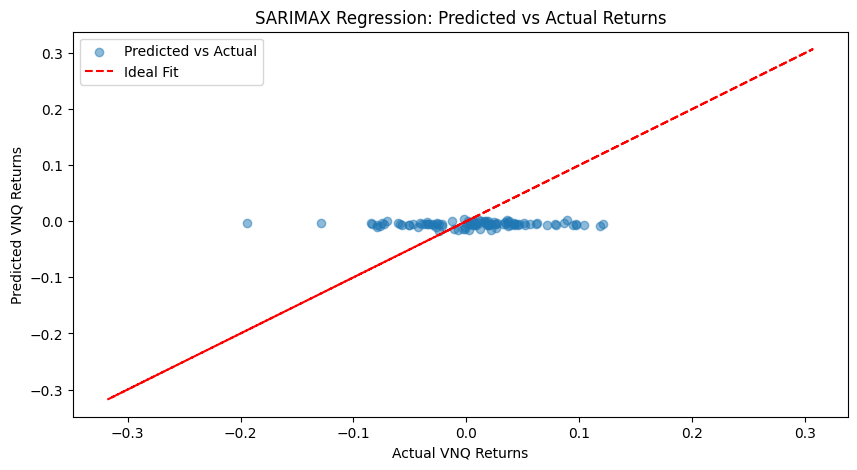

In [317]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import StandardScaler

def expanding_sarimax_forecast(X, y, window=120, order=(1,0,1), seasonal_order=(0,0,0,0), scale_X=True):
    """Expanding-window SARIMAX with exogenous regressors"""
    pred = pd.Series(index=y.index, dtype=float)

    for i in range(window, len(y)):
        y_train, X_train = y.iloc[:i], X.iloc[:i]
        y_test,  X_test  = y.iloc[i],  X.iloc[[i]]

        if scale_X:
            scaler = StandardScaler().fit(X_train)
            X_train_scaled = scaler.transform(X_train)
            X_test_scaled  = scaler.transform(X_test)
        else:
            X_train_scaled = X_train
            X_test_scaled  = X_test

        model = SARIMAX(y_train,
                        exog=X_train_scaled,
                        order=order,
                        seasonal_order=seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False)
        results = model.fit(disp=False)

        pred.iloc[i] = results.predict(exog=X_test_scaled)[0]

        if i == window:
            print(results.summary())

    return pred

# Run SARIMAX
sarimax_pred = expanding_sarimax_forecast(X, y, order=(1,0,1))

# Evaluate
evaluate_preds(sarimax_pred, y)

plt.figure(figsize=(10, 5))
plt.scatter(y, sarimax_pred, alpha=0.5, label='Predicted vs Actual')
plt.plot(y, y, color='red', linestyle='--', label='Ideal Fit')
plt.xlabel('Actual VNQ Returns')
plt.ylabel('Predicted VNQ Returns')
plt.title('SARIMAX Regression: Predicted vs Actual Returns')
plt.legend()
plt.show()

## Random Forest

In [320]:
# X, y from your earlier function (NO add_constant)
X, y = make_lagged_X(factors, vnq_prices)

print("Feature count:", X.shape[1], " | sample =", len(y))


Feature count: 12  | sample = 220


In [327]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import numpy as np

def expanding_rf_forecast(X, y,
                          window            = 120,
                          n_estimators      = 400,
                          max_depth         = None,
                          min_samples_leaf  = 3,
                          max_features      = 1.0,      # ★  NEW
                          random_state      = 42):
    """
    Expanding-window Random-Forest 1-step forecast.
    Returns:  predictions Series, avg feature-importance.
    """
    pred  = pd.Series(index=y.index, dtype=float)
    impor = []

    for i in range(window, len(y)):
        X_tr, y_tr = X.iloc[:i],   y.iloc[:i]
        X_te       = X.iloc[[i]]

        rf = RandomForestRegressor(
                n_estimators     = n_estimators,
                max_depth        = max_depth,
                min_samples_leaf = min_samples_leaf,
                max_features     = max_features,   # ★ pass through
                random_state     = random_state,
                n_jobs           = -1
             )
        rf.fit(X_tr, y_tr)
        pred.iloc[i] = rf.predict(X_te)[0]
        impor.append(rf.feature_importances_)

        if i == window:
            print(f'First fit: trees={n_estimators}, max_features={max_features}')

    fi = (pd.DataFrame(impor, columns=X.columns)
            .mean()
            .sort_values(ascending=False))
    return pred, fi
rf_pred, rf_imp = expanding_rf_forecast(
        X, y,
        n_estimators=500,
        max_depth=3,
        min_samples_leaf=5,
        max_features=0.4      # ← now accepted
)


First fit: trees=500, max_features=0.4



📊 RF evaluation  |  R = 0.057   RMSE = 0.05341


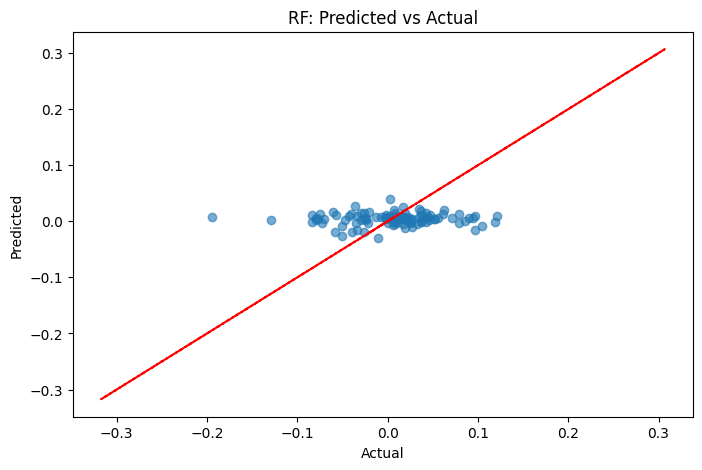

In [328]:
def eval_preds(pred, y_true):
    mask = ~pred.isna()
    r   = np.corrcoef(pred[mask], y_true[mask])[0,1]
    rmse= np.sqrt(mean_squared_error(y_true[mask], pred[mask]))
    print(f"\n📊 RF evaluation  |  R = {r:.3f}   RMSE = {rmse:.5f}")

eval_preds(rf_pred, y)

# quick scatter
plt.figure(figsize=(8,5))
plt.scatter(y, rf_pred, alpha=0.6)
plt.plot(y, y, 'r--')
plt.xlabel('Actual'); plt.ylabel('Predicted'); plt.title('RF: Predicted vs Actual')
plt.show()


In [329]:
print("\nTop 10 avg feature importances")
print(rf_imp.head(10).round(3))



Top 10 avg feature importances
REP_l10       0.116
dMORTG_l9     0.110
VNQ_ret_l2    0.104
DEF_l3        0.099
DEF_l5        0.094
DEF_l4        0.083
REP_l9        0.081
REP_l11       0.077
dMORTG_l10    0.069
VNQ_ret_l1    0.064
dtype: float64



Signal distribution:
  0    200
 1     12
-1      8
Name: count, dtype: int64


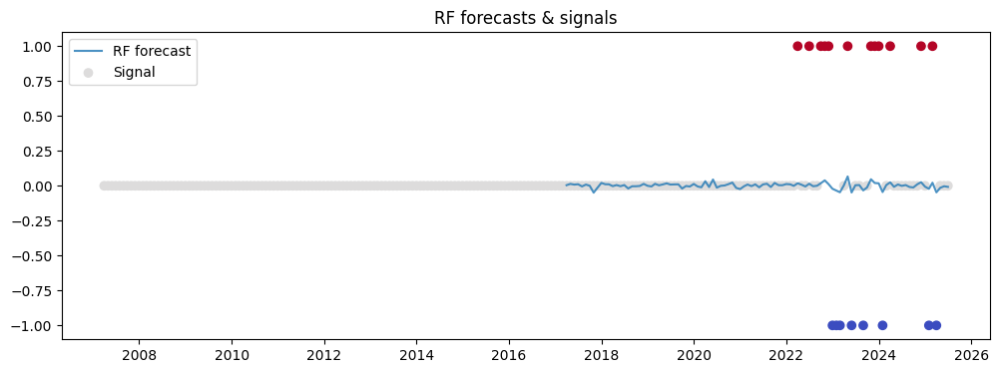

In [324]:
sigma = rf_pred.rolling(60).std()          # 5-yr rolling vol of forecasts
k     = 0.7                                # sensitivity knob: 0.5–1.0 typical
thr   = k * sigma

sig = pd.Series(0, index=rf_pred.index)
sig[rf_pred >  thr] =  1
sig[rf_pred < -thr] = -1

print("\nSignal distribution:\n", sig.value_counts())

plt.figure(figsize=(12,4))
plt.plot(y.index, rf_pred, label='RF forecast', alpha=0.8)
plt.scatter(y.index, sig, c=sig, cmap='coolwarm', marker='o', label='Signal')
plt.legend(); plt.title('RF forecasts & signals'); plt.show()


## XGBoost

In [336]:
from lightgbm import LGBMRegressor
import pandas as pd, numpy as np

def expanding_lgb_forecast(X, y,
                           window        = 120,
                           n_estimators  = 800,
                           learning_rate = 0.03,
                           max_depth     = 3,
                           subsample     = 0.7,
                           colsample     = 0.7,
                           random_state  = 42):
    pred = pd.Series(index=y.index, dtype=float)
    for i in range(window, len(y)):
        model = LGBMRegressor(n_estimators = n_estimators,
                              learning_rate= learning_rate,
                              max_depth    = max_depth,
                              subsample    = subsample,
                              colsample_bytree = colsample,
                              random_state = random_state)
        model.fit(X.iloc[:i], y.iloc[:i])
        pred.iloc[i] = model.predict(X.iloc[[i]])[0]
        if i == window:
            print(f"First window fitted – depth={max_depth}, LR={learning_rate}")
    return pred, model.feature_name_

# run
lgb_pred, feat_names = expanding_lgb_forecast(X, y)
mask = ~lgb_pred.isna()
print("LightGBM R :", np.corrcoef(lgb_pred[mask], y[mask])[0,1].round(3))


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 478
[LightGBM] [Info] Number of data points in the train set: 120, number of used features: 12
[LightGBM] [Info] Start training from score 0.006891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [334]:
y.to_csv('vnq_returns.csv', index=True)

### Checking for 3 month interval

In [337]:
y3 = vnq_prices.pct_change(3).shift(-3).reindex(X.index)
lgb_pred3, _ = expanding_lgb_forecast(X, y3, n_estimators=800,
                                      learning_rate=0.03, max_depth=3)
print("LightGBM 3-month R :", lgb_pred3.corr(y3).round(3))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 478
[LightGBM] [Info] Number of data points in the train set: 120, number of used features: 12
[LightGBM] [Info] Start training from score 0.020335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

## GradientBoostingClassifier

In [340]:
import numpy as np
import pandas as pd
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score, roc_auc_score

# 1) Create binary direction target: 1 if next-month return > 0, else 0
ret1 = vnq_prices.pct_change().shift(-1)        # 1-step ahead return
y_cls = (ret1 > 0).astype(int)                  # binary: up (1) vs down (0)

# 2) Build X with your existing make_lagged_X (no constant)
X_all, y_all = make_lagged_X(factors, vnq_prices)

# 3) Align & drop any rows where target or predictors are missing
y_bin = y_cls.reindex(X_all.index)
mask  = y_bin.notna()
X_cls = X_all.loc[mask]
y_bin = y_bin.loc[mask]

# sanity check
print("Classes:", y_bin.value_counts())

# 4) Expanding-window classification
def expanding_hgb_class(X, y, window=120):
    pred_prob = pd.Series(index=y.index, dtype=float)
    for i in range(window, len(y)):
        mdl = HistGradientBoostingClassifier(
                  max_depth=3,
                  learning_rate=0.05,
                  max_iter=500,
                  l2_regularization=0.1
              )
        mdl.fit(X.iloc[:i], y.iloc[:i])
        pred_prob.iloc[i] = mdl.predict_proba(X.iloc[[i]])[0,1]
        if i == window:
            print("First fit classes:", mdl.classes_)
    return pred_prob

prob_up = expanding_hgb_class(X_cls, y_bin)

# 5) Evaluate
mask = ~prob_up.isna()
pred_dir = (prob_up[mask] > 0.5).astype(int)   # threshold=0.5
print("\nAccuracy:", accuracy_score(y_bin[mask], pred_dir))
print("AUC     :", roc_auc_score(y_bin[mask], prob_up[mask]))


Classes: VNQ
1    129
0     91
Name: count, dtype: int64
First fit classes: [0 1]

Accuracy: 0.57
AUC     : 0.5161290322580645


## STRAT

In [275]:
def backtest(pred, ret, thr):
    sig   = np.where(pred >  thr,  1,
             np.where(pred < -thr, -1, 0))
    costs = np.abs(np.diff(np.r_[0, sig])) * 0.002      # 10 bp
    pnl   = sig * ret - costs
    eq    = (1 + pnl).cumprod()
    sharpe = pnl.mean() / pnl.std() * np.sqrt(12)
    mdd    = (eq / eq.cummax() - 1).min()
    trades = (np.diff(sig != 0)).sum()
    return sharpe, mdd, trades, pnl, eq


=== Grid-search (best Sharpe highlighted) ===


,Sharpe,Max DD,Trades
thr %,,,
0.050000,0.169181,-0.493561,3
0.100000,0.169181,-0.493561,3
0.150000,0.203456,-0.451625,9
0.200000,0.161089,-0.451625,11
0.250000,0.166745,-0.451625,11
0.300000,0.175355,-0.430124,17


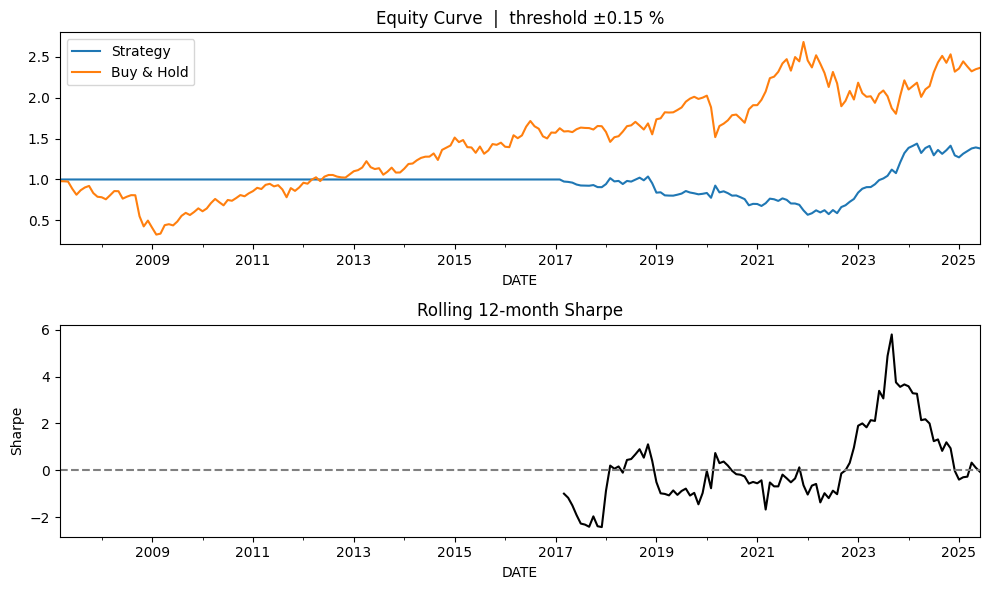


Best threshold ±0.15 %
Sharpe (ann.) : 0.20
Max drawdown  : -45.16%
Trades        : 9


In [ ]:
# --------------------------------------------------------------------
# threshold grid & performance
# --------------------------------------------------------------------


rows, details = [], {}
thr_grid = np.arange(0.0005, 0.0035, 0.0005)   # 0.05 % … 0.30 %
for t in thr_grid:
    s, d, n, pnl, eq = backtest(pred, y, thr=t)
    rows.append([t*100, s, d, n])
    details[t] = eq, pnl
perf = pd.DataFrame(rows, columns=['thr %','Sharpe','Max DD','Trades']
                    ).set_index('thr %')

best_thr = perf['Sharpe'].idxmax() / 100
best_eq, best_pnl = details[best_thr]

print("\n=== Grid-search (best Sharpe highlighted) ===")
display(perf.style.highlight_max(subset=['Sharpe']))

# ====================================================================
# 3.  Charts
# ====================================================================
fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=False)

# Equity curve
best_eq.plot(ax=ax[0], label='Strategy')
(1 + y).cumprod().plot(ax=ax[0], label='Buy & Hold')
ax[0].set_title(f'Equity Curve  |  threshold ±{best_thr*100:.2f} %')
ax[0].legend()

# Rolling 12-mo Sharpe
rolling_sh = best_pnl.rolling(12).apply(lambda x: x.mean()/x.std()*np.sqrt(12), raw=False)
rolling_sh.plot(ax=ax[1], color='k'); ax[1].axhline(0, ls='--', c='grey')
ax[1].set_title('Rolling 12-month Sharpe'); ax[1].set_ylabel('Sharpe')

plt.tight_layout(); plt.show()

# ====================================================================
# 4.  Quick performance print-out
# ====================================================================
print(f"\nBest threshold ±{best_thr*100:.2f} %")
print(f"Sharpe (ann.) : {perf.loc[best_thr*100,'Sharpe']:.2f}")
print(f"Max drawdown  : {perf.loc[best_thr*100,'Max DD']:.2%}")
print(f"Trades        : {int(perf.loc[best_thr*100,'Trades'])}")


In [282]:
s, dd, n, pnl, eq = backtest(pred, y, thr=0.0002)
print("Sharpe", s, "Max-DD", dd, "Trades", n)


Sharpe 0.11632883610183686 Max-DD -0.5177646247779719 Trades 1


In [281]:
# rolling 60-month stdev of forecast
sigma = pred.rolling(60).std()
k = 0.5                              # sensitivity factor
thr_dyn = k * sigma

sig_dyn = np.where(pred >  thr_dyn,  1,
           np.where(pred < -thr_dyn, -1, 0))

cost  = np.abs(np.diff(np.r_[0, sig_dyn]))*0.001
pnl   = sig_dyn*y - cost
eq    = (1+pnl).cumprod()

print("Sharpe", pnl.mean()/pnl.std()*np.sqrt(12),
      "Max-DD", (eq/eq.cummax()-1).min(),
      "Trades", (np.diff(sig_dyn!=0)).sum())


Sharpe 0.6203998368668304 Max-DD -0.10067479276183577 Trades 15


Dynamic-θ grid:
        Sharpe     MaxDD  Trades
k                              
0.2  0.667073 -0.100675      11
0.3  0.643509 -0.100675      13
0.5  0.620400 -0.100675      15
0.4  0.598848 -0.100675      13
0.7  0.536970 -0.100675      16

⭐  Best k = 0.20


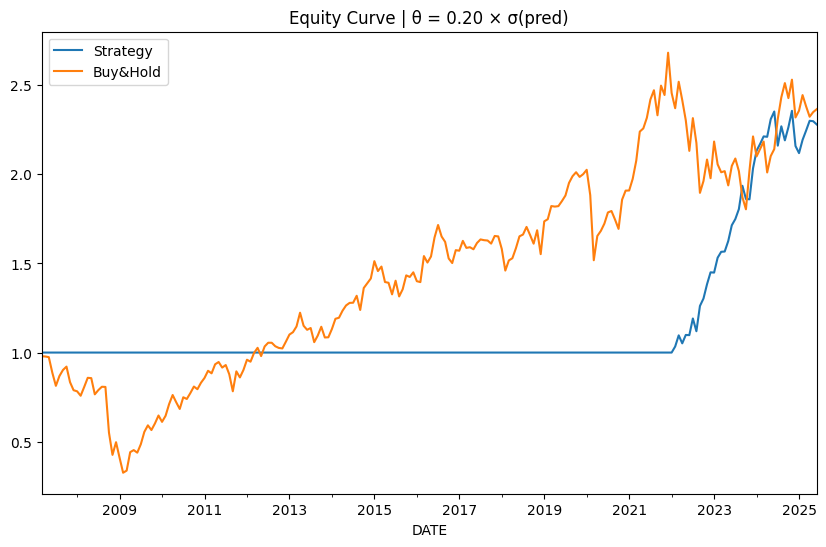

In [283]:
def run_dynamic_threshold(pred, ret, k_grid=np.arange(0.3,1.1,0.1),
                          cost_per_flip=0.001, roll=60, window=120):
    """
    pred : Series of expanding-window forecasts (with NaNs in warm-up)
    ret  : Realised returns aligned to pred index
    k_grid : iterable of multipliers for θ = k * rolling σ(pred)
    cost_per_flip : round-trip cost (default 10 bp)
    roll : window for rolling σ
    """
    sig_dict, rows = {}, []
    sigma = pred.rolling(roll).std()

    for k in k_grid:
        thr = k * sigma
        sig = np.where(pred >  thr,  1,
              np.where(pred < -thr, -1, 0))

        cost = np.abs(np.diff(np.r_[0, sig])) * cost_per_flip
        pnl  = sig * ret - cost
        eq   = (1+pnl).cumprod()

        sharpe = pnl.mean() / pnl.std() * np.sqrt(12)
        mdd    = (eq/eq.cummax()-1).min()
        trades = (np.diff(sig!=0)).sum()

        rows.append([k, sharpe, mdd, trades])
        sig_dict[k] = (eq, pnl, sig)

    perf = pd.DataFrame(rows, columns=['k','Sharpe','MaxDD','Trades']).set_index('k')
    best_k = perf['Sharpe'].idxmax()
    return best_k, perf, sig_dict[best_k]

# --- usage ---------------------------------------------------------
best_k, perf_tbl, (eq_best, pnl_best, sig_best) = run_dynamic_threshold(
        pred, y, k_grid=np.arange(0.2,1.2,0.1))

print("Dynamic-θ grid:\n", perf_tbl.sort_values('Sharpe',ascending=False).head())
print(f"\n⭐  Best k = {best_k:.2f}")

# Plot equity
eq_best.plot(title=f"Equity Curve | θ = {best_k:.2f} × σ(pred)")
(1+y).cumprod().plot(); plt.legend(['Strategy','Buy&Hold']); plt.show()
